# **Detectron2 con un modelo entrenador**

## Realizado por Ismael Franco Hernando

# Instalar Librerias


In [1]:
!pip install pyyaml==5.1

     |████████████████████████████████| 274 kB 8.6 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=e0bc145529fe96026de03aa724f8703acdb2494b3cb51872e57bfca0798e3a1d
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [2]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 7.4 MB/s 
     |████████████████████████████████| 50 kB 6.2 MB/s 
     |████████████████████████████████| 147 kB 19.6 MB/s 
     |████████████████████████████████| 130 kB 67.5 MB/s 
     |████████████████████████████████| 74 kB 4.0 MB/s 
     |████████████████████████████████| 749 kB 69.7 MB/s 
     |████████████████████████████████| 843 kB 51.9 MB/s 
     |████████████████████████████████| 112 kB 71.3 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220414-py3-none-any.whl size=61211 sha256=c4ba9c918eaf026eece69f876f46b277015784b38cf1fba5fadf32237f87bff4
  Stored in directory: /root/.cache/pip/wheels/df/f4/b8/7b5df8b6722f4c72315ce70c31aa693e00cef6a5056149bd28
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=ee772731cccb49fc4286d8971a9f6a427ce31cbda448a8252a64d9ef5c295

# Imports

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Librerias de uso común
import numpy as np
import os, json, cv2, random, shutil
from google.colab.patches import cv2_imshow

# Utilidades del detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode
from detectron2 import structures
from detectron2.structures.boxes import Boxes

# Distrubución de los datos de forma aleatoria

In [4]:
def crea_directorio(directorio):
    if not os.path.isdir(directorio):
        os.makedirs(directorio, exist_ok=True)

def mueve_imagenes(directorio_salida, lista):
    crea_directorio(directorio_salida)

    for l in lista:
        ruta = l.split("/")
        imagen = ruta[1].split(".")
        json = imagen[0] + '_1.json'
        json2 = imagen[0] + '_2.json'

        shutil.move(l, directorio_salida+ruta[1])
        shutil.move(ruta[0]+'/'+json, directorio_salida+json)
        shutil.move(ruta[0]+'/'+json2, directorio_salida+json2)


def distribuye_imagenes(origen, dir_train, dir_test, 
                        porcentajes=[0.6, 0.4]):
    lista = []
    for fichero in os.listdir(origen):
        if fichero.endswith('.png'):
            lista.append(origen+fichero)

    totales = len(lista)
    lista_random = np.random.choice(lista, totales, False)

    lista_train = []
    lista_test = []
    tam_train = porcentajes[0] * totales
    tam_test = porcentajes[1] * totales

    for ele in lista_random:
        if len(lista_test) < tam_test-1 or len(lista_test) == tam_test-1:
            lista_test.append(ele)
        else:
            lista_train.append(ele)

    mueve_imagenes(dir_train, lista_train)
    mueve_imagenes(dir_test, lista_test)

    print("Hay un total de " + str(totales) + " imagenes")
    print(str(len(lista_train)) + " son para entrenamiento")
    print(str(len(lista_test)) + " son para test")



In [5]:
distribuye_imagenes('todos/', 'train/', 'test/')

Hay un total de 30 imagenes
18 son para entrenamiento
12 son para test


# Preparación

In [6]:
def conversor_COCO(directorio):
    #Leemos todos los archivos del directorio y guardamos el nombre de los .json
    ficheros_JSON=[]
    for fichero in os.listdir(directorio):
        if fichero.endswith('.json'):
            ficheros_JSON.append(fichero)
    
    dataset=[]
    #Recorremos cada fichero
    for fichero in ficheros_JSON:
        f_json=os.path.join(directorio, fichero) #Cargamos la ruta de cada fichero
        with open(f_json) as f: #Cargamos el fichero
            json_cargado = json.load(f)
        
        diccionario={}
        key_fichero=list(json_cargado.keys())[0]
        
        #ruta_imagen = os.path.join(directorio, json_cargado[key_fichero]['filename'])        
        ruta_imagen = os.path.join(directorio, fichero[:-7]+".png")
        altura=cv2.imread(ruta_imagen).shape[0]
        anchura=cv2.imread(ruta_imagen).shape[1]
        
        diccionario["file_name"] = ruta_imagen
        diccionario["height"] = altura
        diccionario["width"] = anchura
        
        valores=[]
        regiones=json_cargado[key_fichero]['regions'] 

        parte1,parte2=fichero.split(".")
        if parte1[-1]=='1':
            etiqueta=0
        else:
            etiqueta=1
            
        for i in range(len(regiones)):
            puntos_x=regiones[i]['shape_attributes']['all_points_x']
            puntos_y=regiones[i]['shape_attributes']['all_points_y']
            forma = [(x, y) for x, y in zip(puntos_x, puntos_y)] 
            forma = [p for x in forma for p in x]
            
            valor= {"bbox": [np.min(puntos_x),np.min(puntos_y),np.max(puntos_x),np.max(puntos_y)],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation": [forma],
                    "category_id": etiqueta}
            
            valores.append(valor)
        diccionario["annotations"] = valores
        dataset.append(diccionario)
    return dataset    

In [7]:
clases = ['diente', 'nervio']

for d in ["train", "test"]:
    DatasetCatalog.register("prueba_" + d, lambda d=d: conversor_COCO(d+"/"))
    MetadataCatalog.get("prueba_" + d).set(thing_classes=clases)

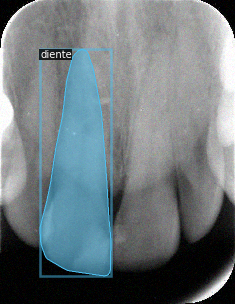

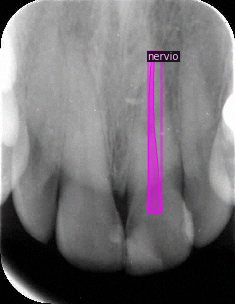

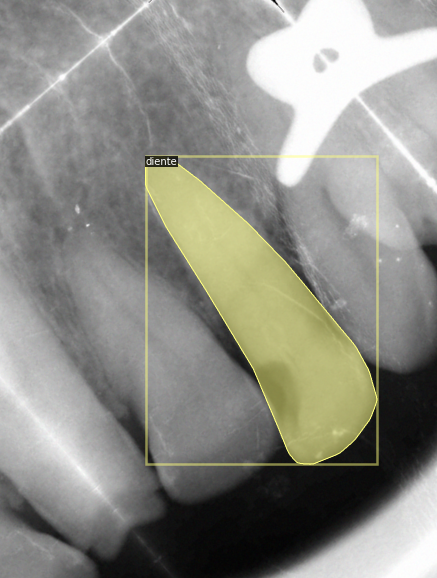

In [ ]:
prueba_metadata = MetadataCatalog.get("prueba_train")
dataset_dicts = conversor_COCO("train/")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=prueba_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])    

# Configuración

In [8]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("prueba_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1500
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.TEST.DTECTIONS_PER_IMAGE = 2

In [9]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/25 11:03:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 85.9MB/s]                          
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to in

[04/25 11:03:42 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/25 11:03:52 d2.utils.events]:  eta: 0:10:49  iter: 19  total_loss: 1.978  loss_cls: 1.14  loss_box_reg: 0.08091  loss_mask: 0.6946  loss_rpn_cls: 0.02352  loss_rpn_loc: 0.01392  time: 0.4450  data_time: 0.0337  lr: 4.9953e-06  max_mem: 2336M
[04/25 11:04:01 d2.utils.events]:  eta: 0:10:42  iter: 39  total_loss: 1.798  loss_cls: 0.9385  loss_box_reg: 0.0808  loss_mask: 0.6917  loss_rpn_cls: 0.01781  loss_rpn_loc: 0.014  time: 0.4378  data_time: 0.0066  lr: 9.9902e-06  max_mem: 2336M
[04/25 11:04:09 d2.utils.events]:  eta: 0:10:20  iter: 59  total_loss: 1.425  loss_cls: 0.6208  loss_box_reg: 0.08944  loss_mask: 0.6835  loss_rpn_cls: 0.01582  loss_rpn_loc: 0.01445  time: 0.4333  data_time: 0.0079  lr: 1.4985e-05  max_mem: 2336M
[04/25 11:04:18 d2.utils.events]:  eta: 0:10:17  iter: 79  total_loss: 1.202  loss_cls: 0.3689  loss_box_reg: 0.07304  loss_mask: 0.6757  loss_rpn_cls: 0.02007  loss_rpn_loc: 0.01559  time: 0.4348  data_time: 0.0091  lr: 1.998e-05  max_mem: 2336M
[04/25 11:04:2

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50
predictor = DefaultPredictor(cfg)

In [ ]:
test_dataset = conversor_COCO("test/")

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


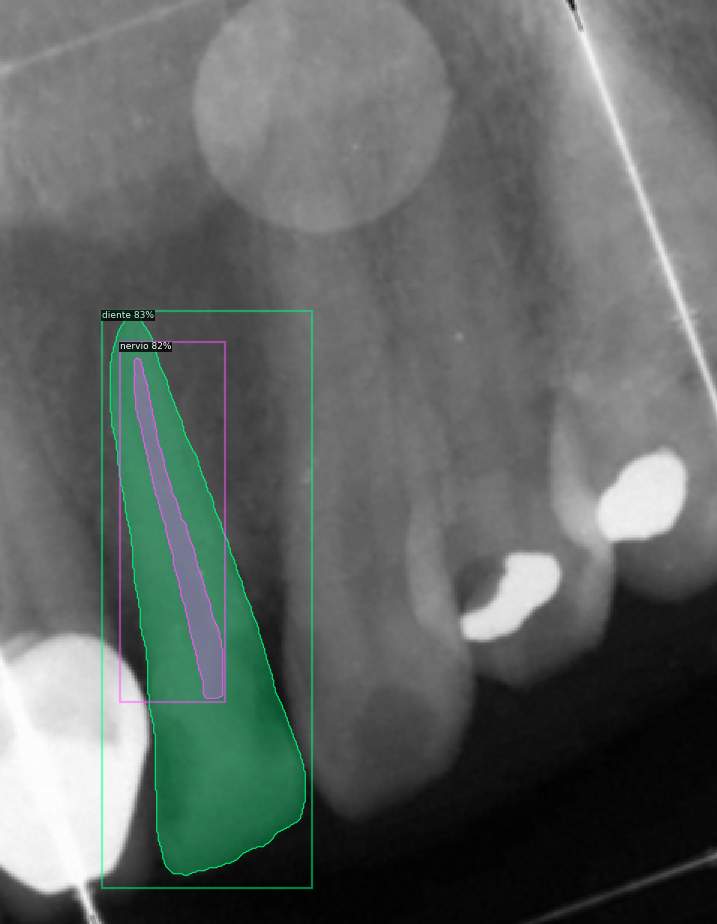

La precisión obtenida en el diente es [[0.872767]]


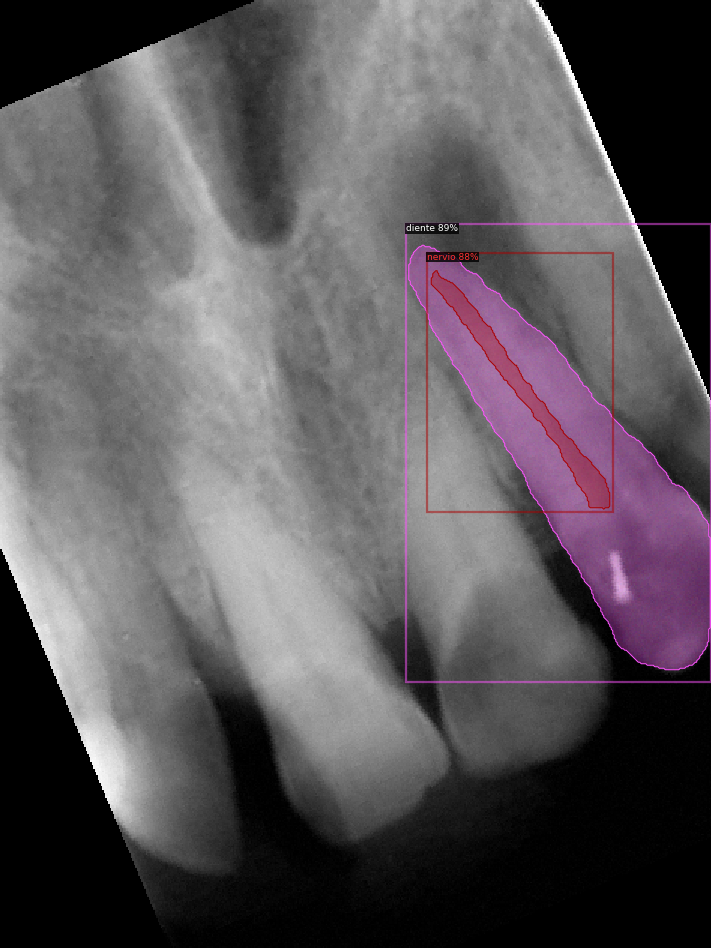

La precisión obtenida en el diente es [[0.8952408]]


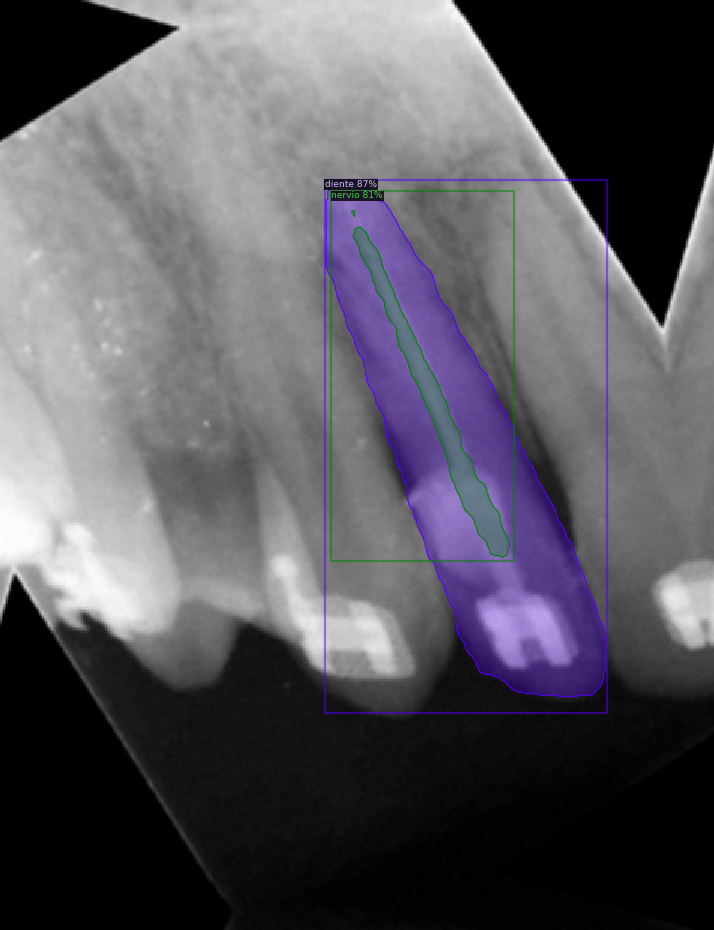

La precisión obtenida en el nervio es [[0.83261544]]


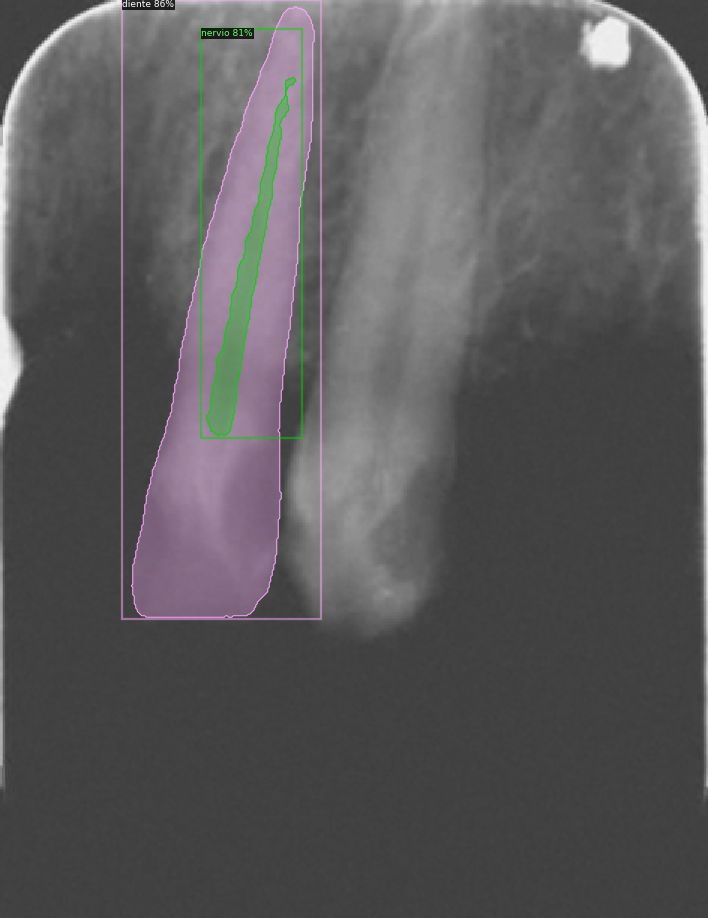

La precisión obtenida en el diente es [[0.93079877]]


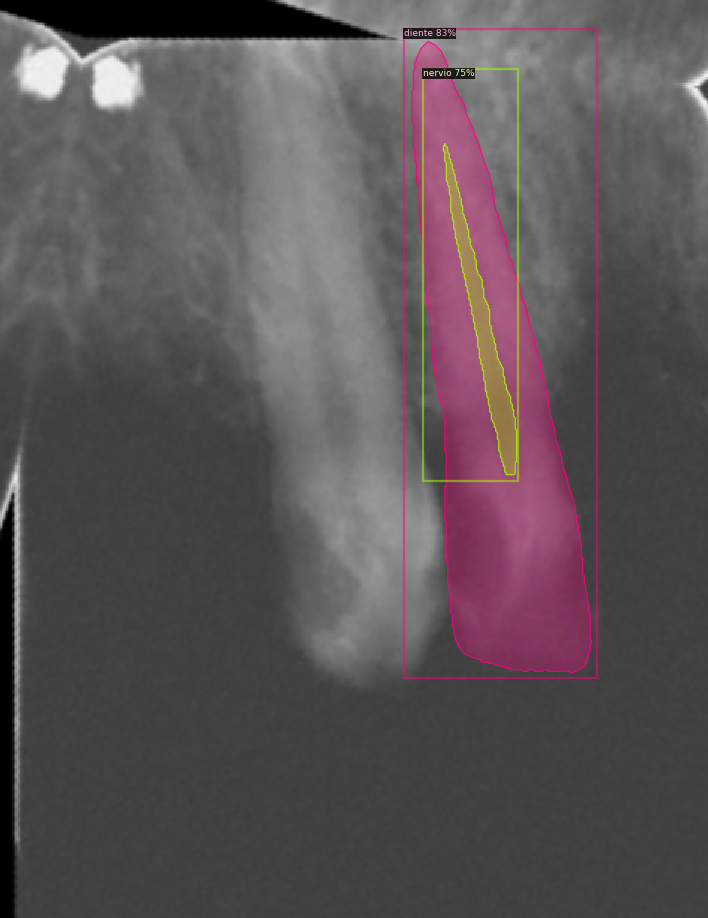

La precisión obtenida en el nervio es [[0.88615125]]


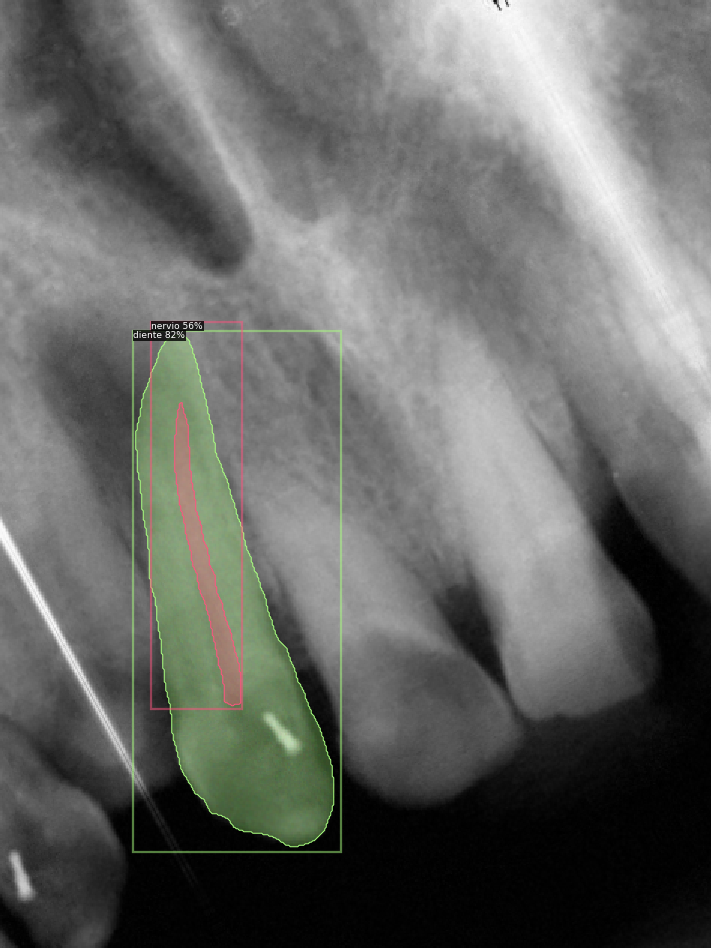

La precisión obtenida en el nervio es [[0.6160447]]


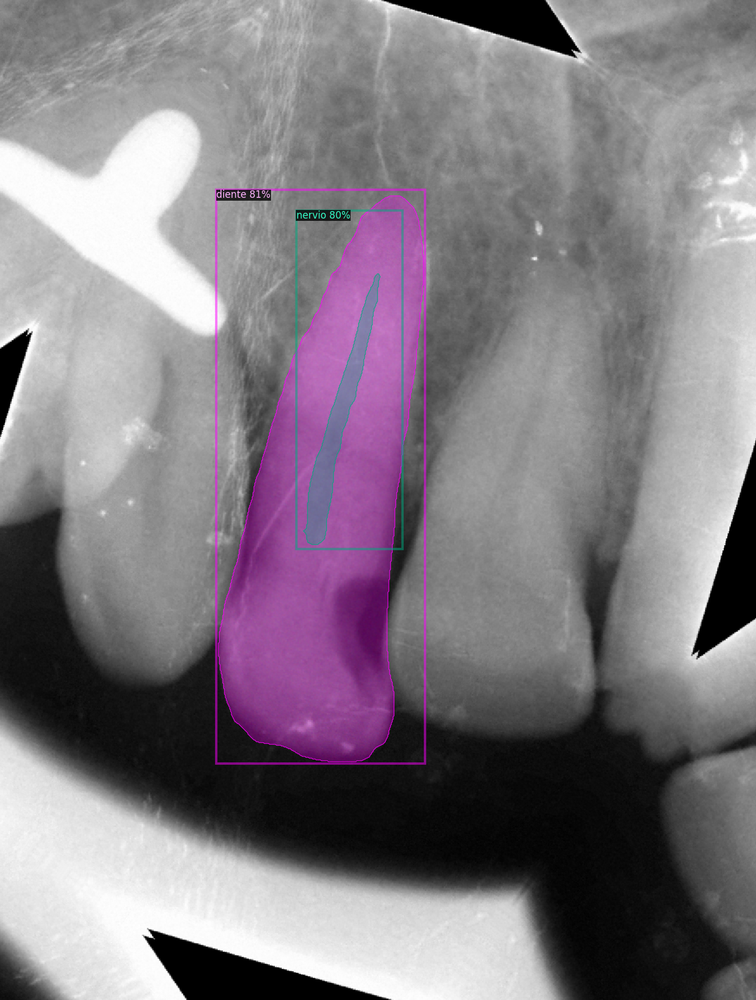

La precisión obtenida en el nervio es [[0.6578383]]


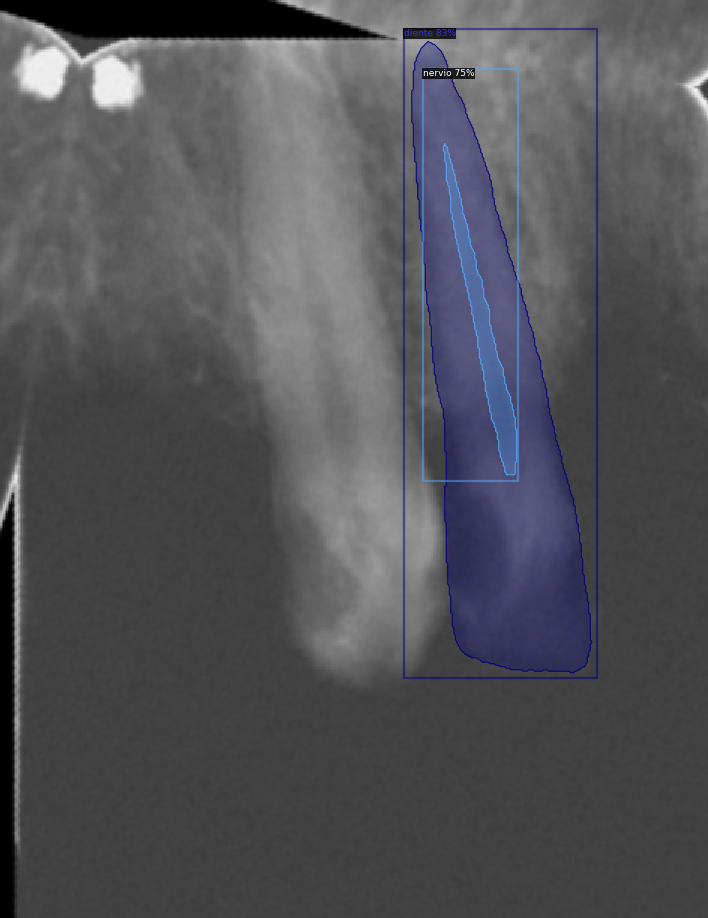

La precisión obtenida en el diente es [[0.8927721]]


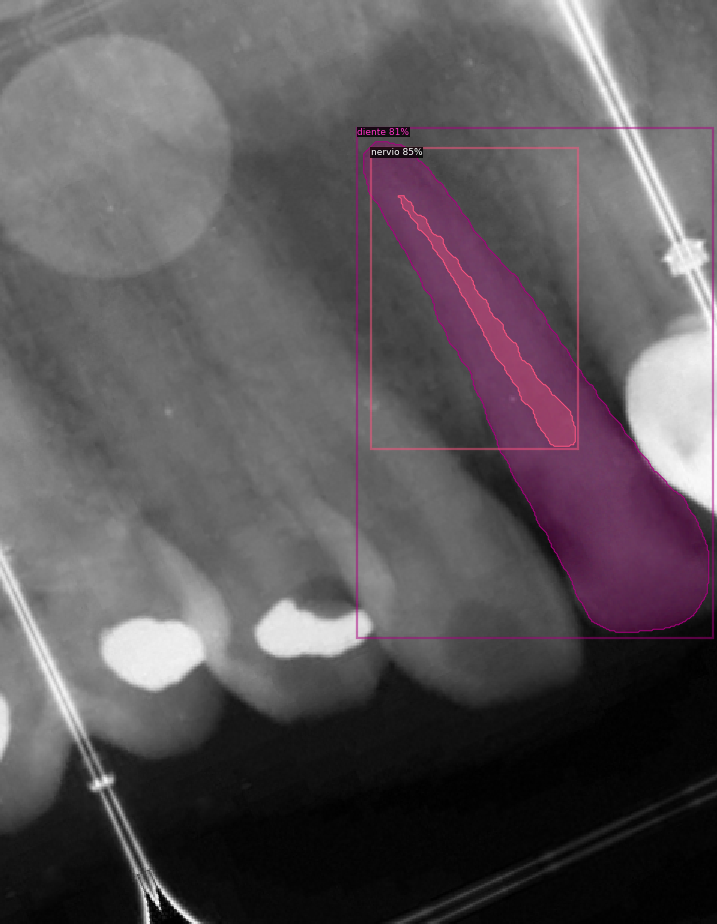

La precisión obtenida en el diente es [[0.948836]]


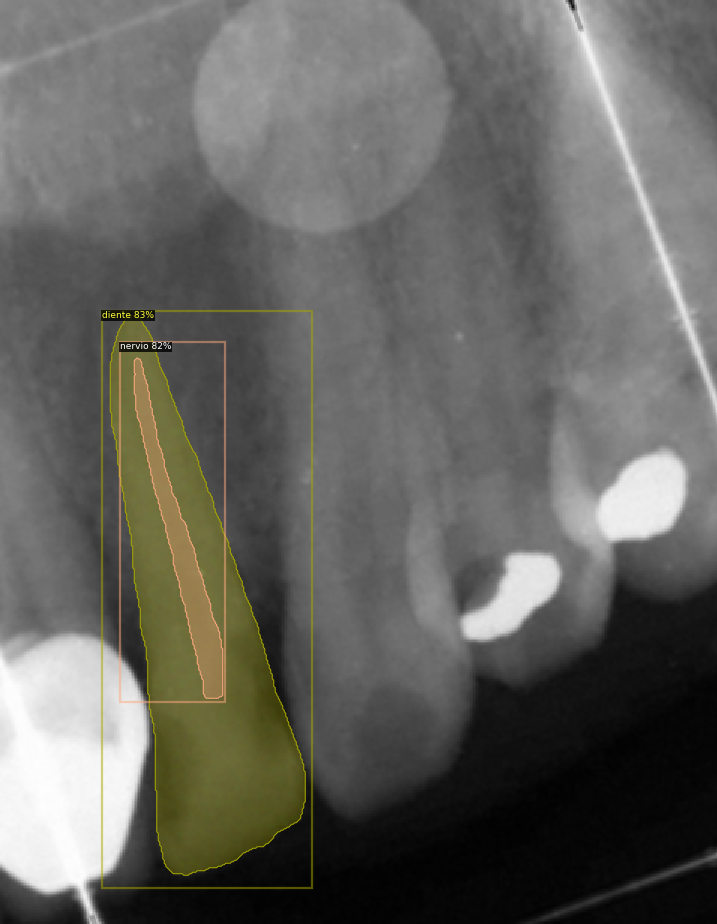

La precisión obtenida en el nervio es [[0.63139]]


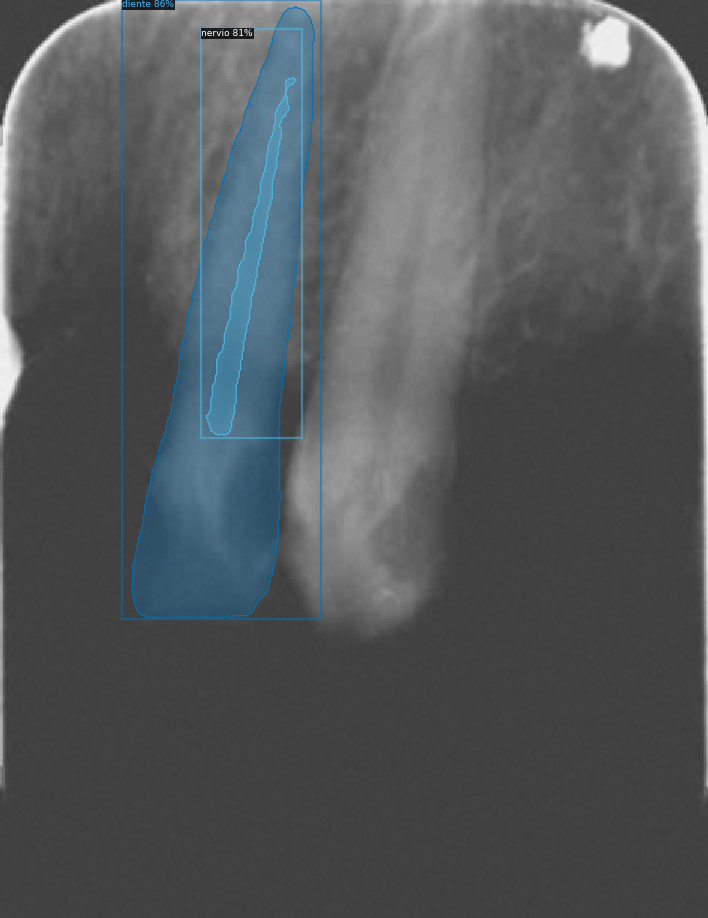

La precisión obtenida en el nervio es [[0.8817303]]


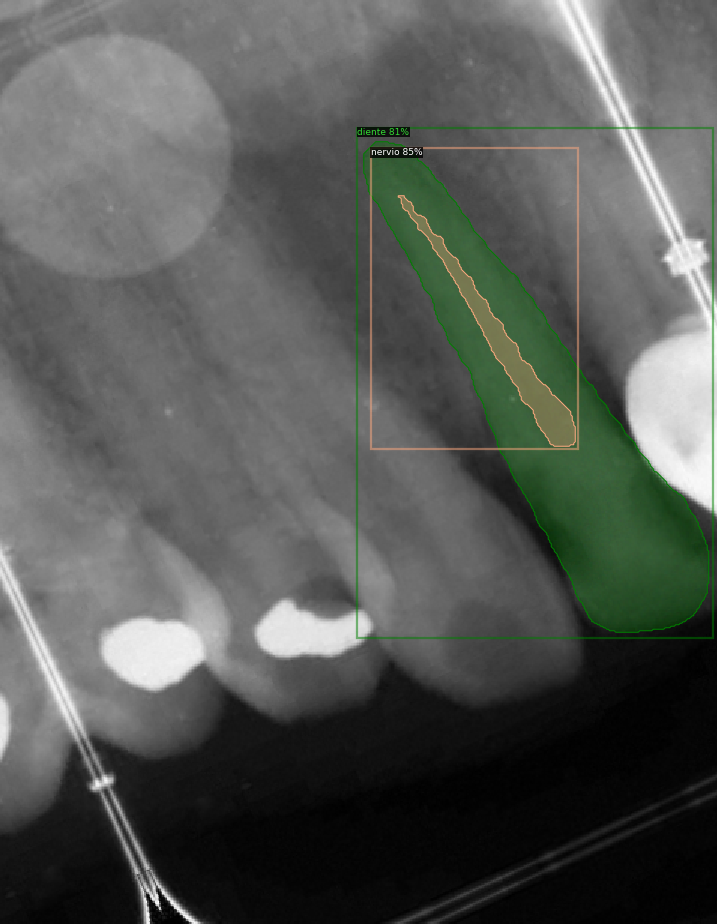

La precisión obtenida en el nervio es [[0.88774526]]


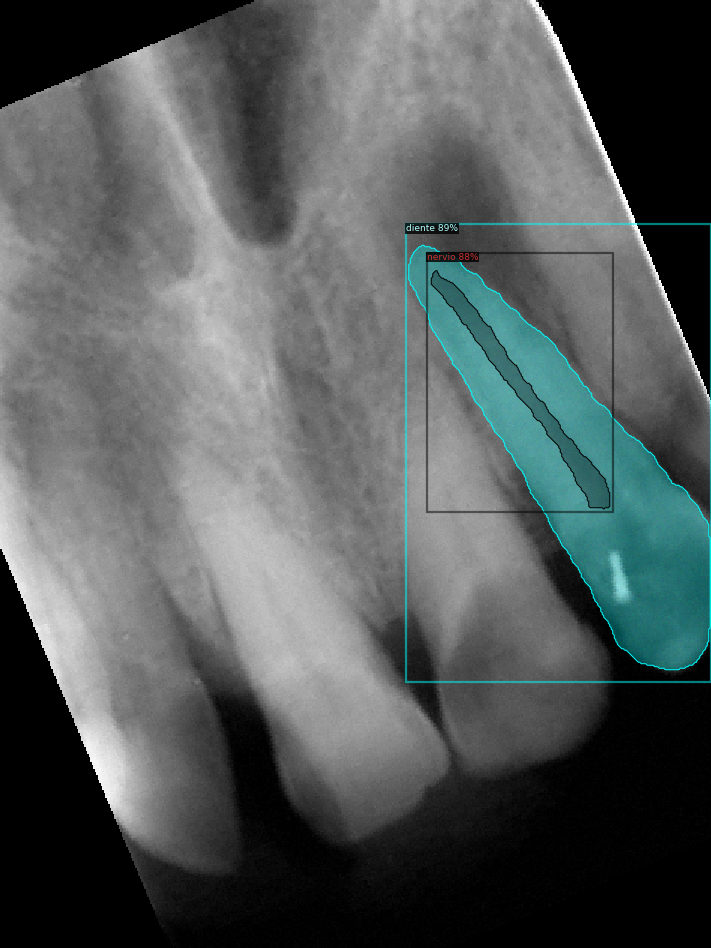

La precisión obtenida en el nervio es [[0.67216575]]


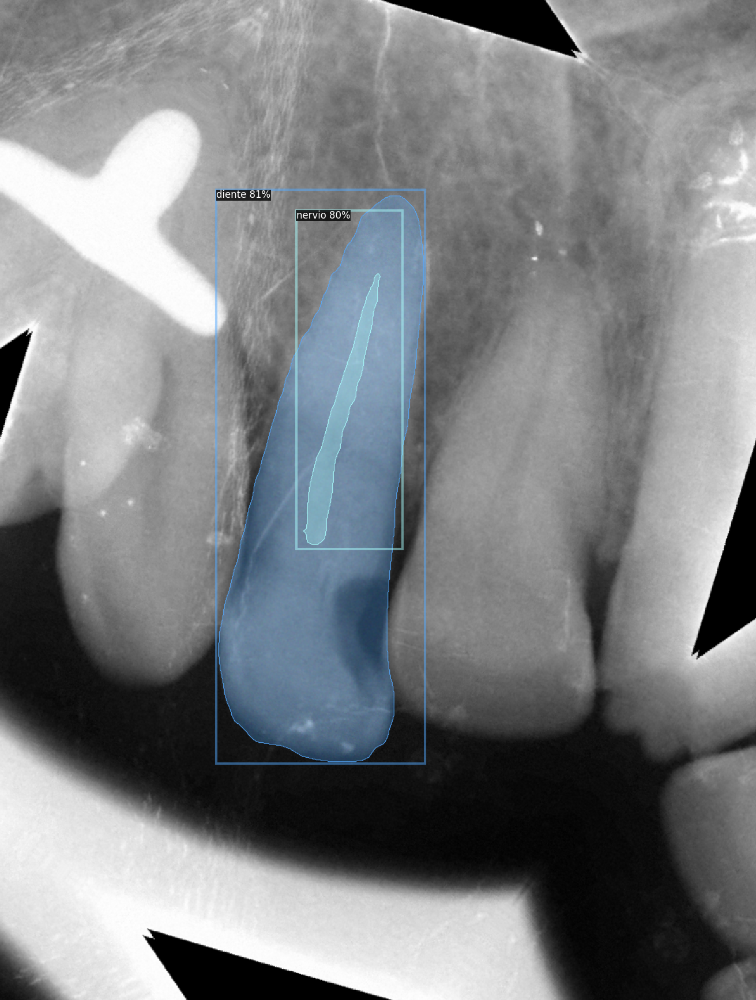

La precisión obtenida en el diente es [[0.9535155]]


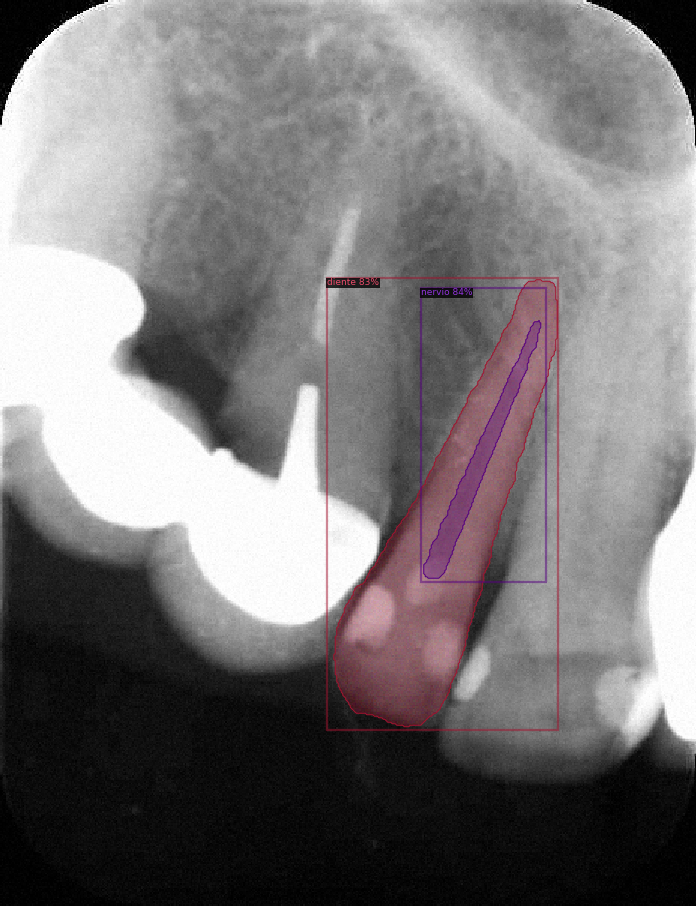

La precisión obtenida en el nervio es [[0.8004102]]


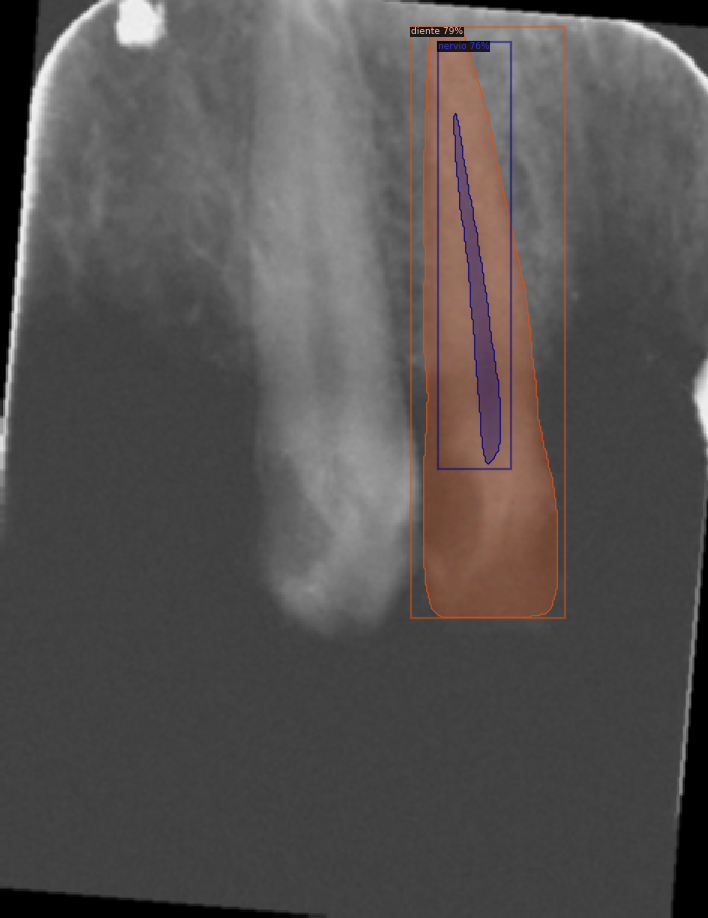

La precisión obtenida en el nervio es [[0.8746491]]


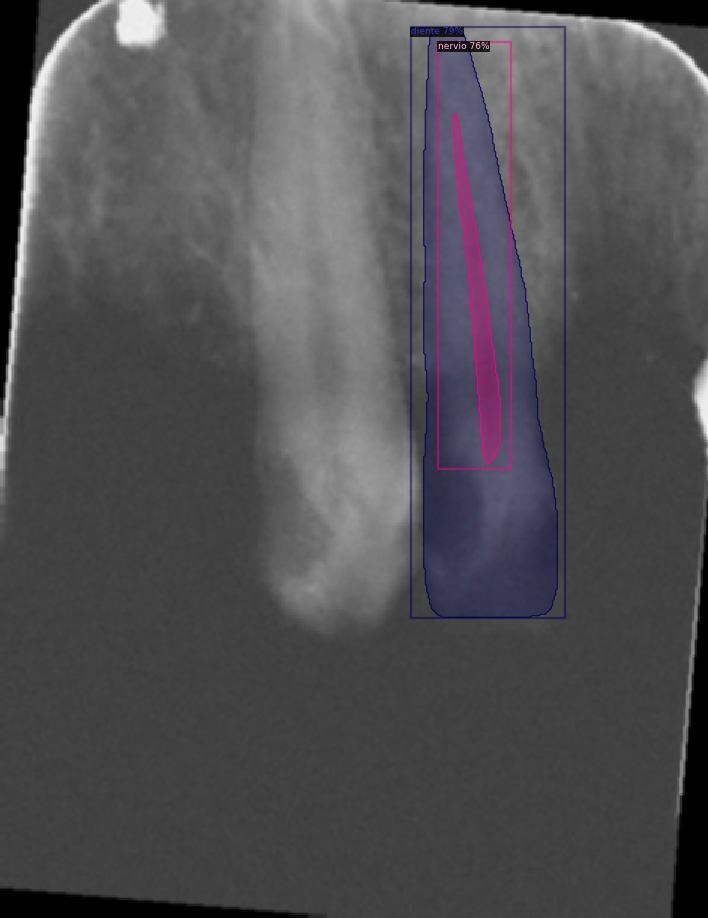

La precisión obtenida en el diente es [[0.91625905]]


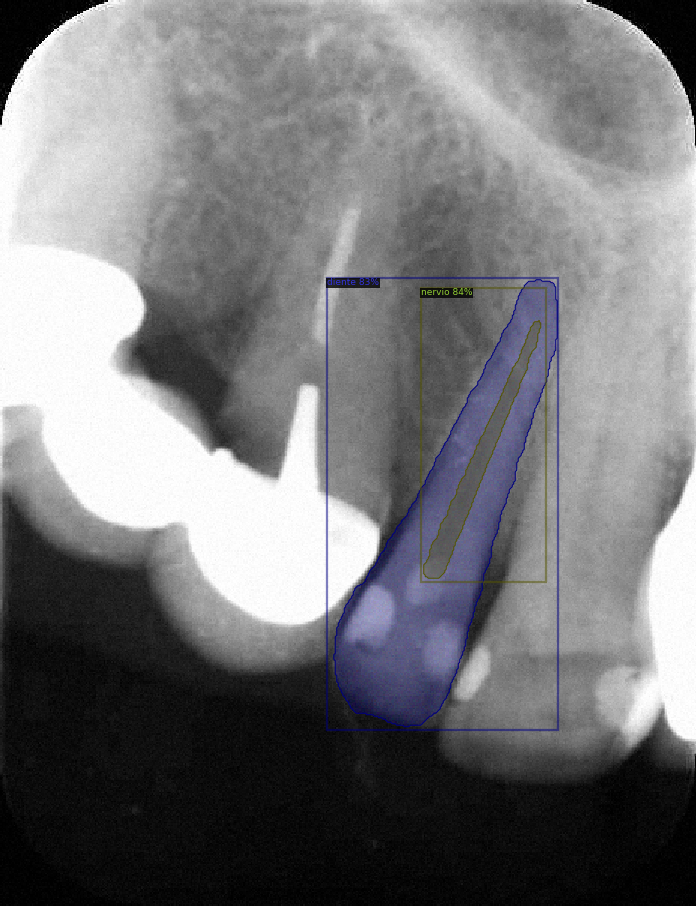

La precisión obtenida en el diente es [[0.966349]]


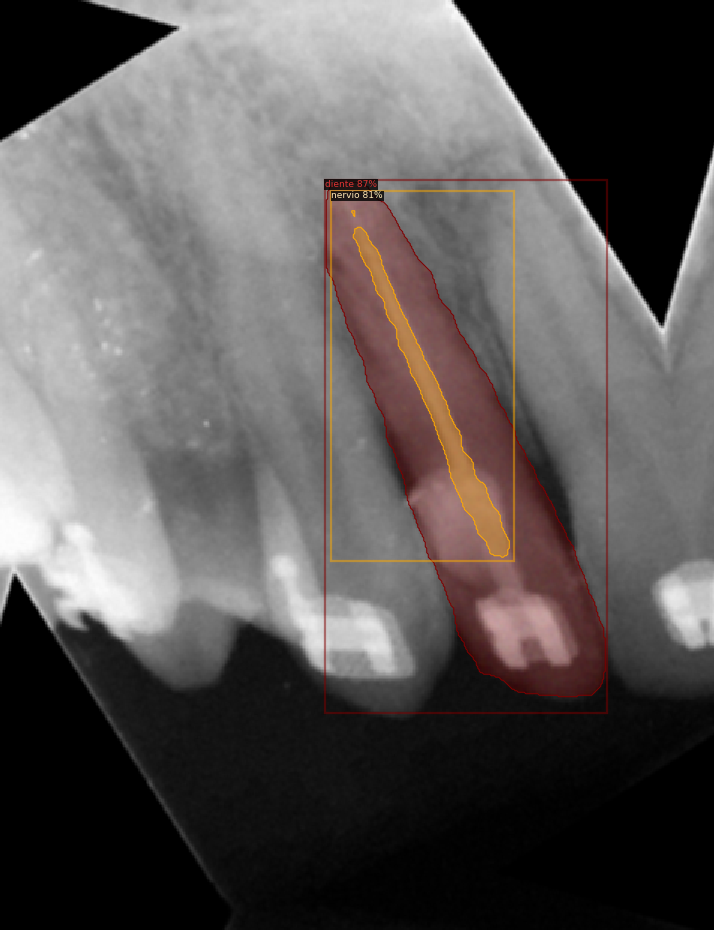

La precisión obtenida en el diente es [[0.9117885]]


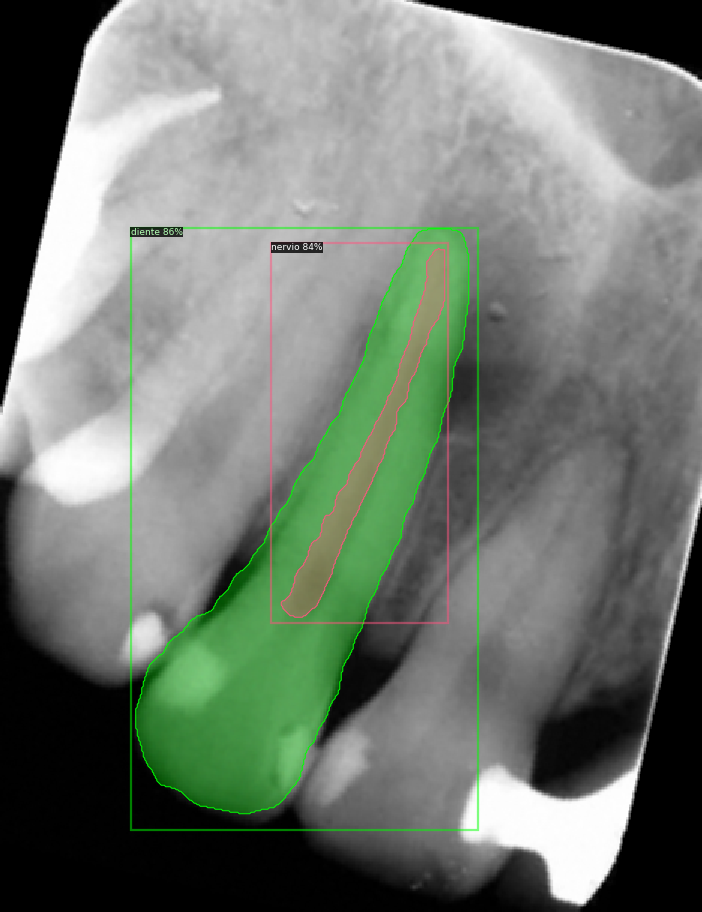

La precisión obtenida en el diente es [[0.9459265]]


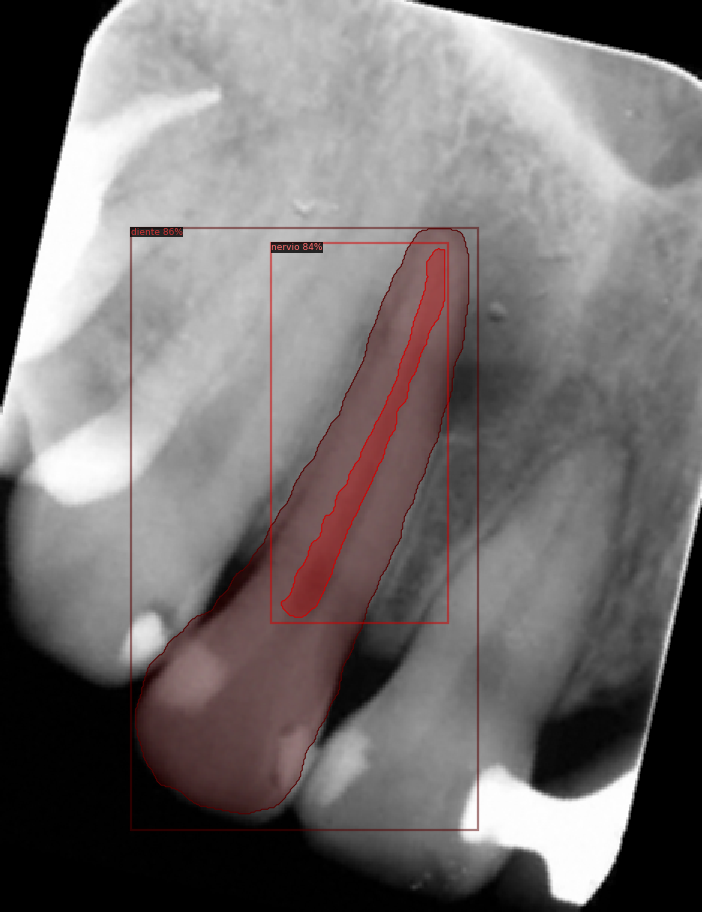

La precisión obtenida en el nervio es [[0.81762475]]


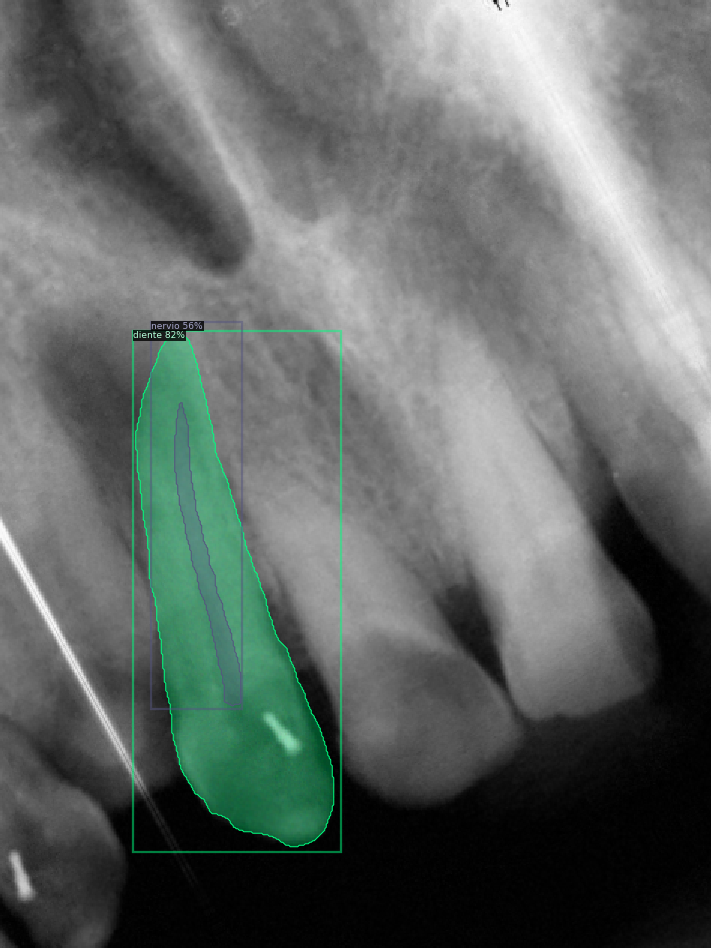

La precisión obtenida en el diente es [[0.84406555]]


La precision media obtenida en los dientes es de: 0.9162109
La precision media obtenida en los nervios es de: 0.7780332


In [ ]:
iou_dientes = []
iou_nervios = []

for d in test_dataset:    
    im = cv2.imread(d["file_name"])
    puntos=d["annotations"][0]["bbox"]
    categoria=d["annotations"][0]["category_id"]
    
    if categoria==0:
      elemento=0
      elemento_str="diente"
    else:
      elemento=1
      elemento_str="nervio"

    outputs = predictor(im) 
    v = Visualizer(im[:, :, ::-1],
                   metadata=prueba_metadata, 
                   scale=1.5, 
                   instance_mode=ColorMode.IMAGE_BW   
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1]) 

    #Calculo Intersection over Union (IoU)
    predicciones=outputs["instances"].pred_boxes #Obtenemos las predicciones  
    torch_array=torch.tensor([(puntos)]).to("cpu") #Creamos el array de torch con los puntos correctos del elemento  
    caja=Boxes(torch_array) #Creamos la caja de los puntos correctos
    iou = []
    iou0 = structures.pairwise_iou(predicciones[0].to("cpu"),caja) #Obtenemos el IoU entre las cajas de la prediccion y la correspondiente al elemento 0    
    iou.append(iou0)
    iou1 = structures.pairwise_iou(predicciones[1].to("cpu"),caja) #Obtenemos el IoU entre las cajas de la prediccion y la correspondiente al elemento 1 
    iou.append(iou1)
    iou = max(iou)
    if elemento==0:
      iou_dientes.append(iou.to("cpu").numpy())
    else:
      iou_nervios.append(iou.to("cpu").numpy())
    print("La precisión obtenida en el",elemento_str,"es",iou.to("cpu").numpy())

iou_dientes = np.array(iou_dientes)
iou_nervios = np.array(iou_nervios)
print("\n\nLa precision media obtenida en los dientes es de:", iou_dientes.mean())
print("La precision media obtenida en los nervios es de:", iou_nervios.mean())